## Overfit a Hologram using 2D Gaussian Splatting

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.nn as nn
import torch
import gc
import os
import imageio
from torch.optim import Adam
from datetime import datetime
from PIL import Image
import requests
from io import BytesIO
import logging
import torch.utils.tensorboard as tensorboard

# Fetch hologram

torch.Size([2400, 4094])
torch.Size([500, 500])


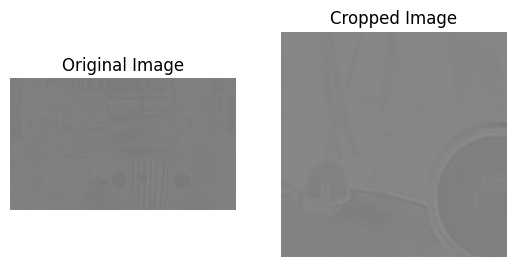

In [2]:
# URL of the sample hologram image
github_url = "https://raw.githubusercontent.com/kaanaksit/odak/master/test/data/sample_hologram.png"

# Fetch the image from GitHub
response = requests.get(github_url)
response.raise_for_status()  # Raise an error for failed requests

# Open the image
image = Image.open(BytesIO(response.content)).convert('L')  # Convert to grayscale

# Convert the image to a numpy array
hologram_array = np.array(image)

# Convert the hologram array to a PyTorch tensor
hologram_tensor = torch.tensor(hologram_array / 255.0, dtype=torch.float32)

# Crop the hologram tensor
left = 1500 # x-coordinate of the left edge
top = 1500  # y-coordinate of the top edge
right = 2000  # x-coordinate of the right edge
bottom = 2000  # y-coordinate of the bottom edge
cropped_hologram_tensor = hologram_tensor[top:bottom, left:right]

# Display the original and cropped images
plt.subplot(1, 2, 1)
plt.imshow(hologram_tensor.numpy(), cmap='gray')
plt.axis('off')  # Hide axes
print(hologram_tensor.shape)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(cropped_hologram_tensor.numpy(), cmap='gray')
plt.axis('off')  # Hide axes
print(cropped_hologram_tensor.shape)
plt.title('Cropped Image')
plt.show()

# Save the cropped image
cropped_image = Image.fromarray((cropped_hologram_tensor.numpy() * 255).astype(np.uint8))
cropped_image.save("cropped_sample_hologram.png")

# Utils Functions

In [3]:
def retrieve_px(input_coords, image_size):

  # normalising pixel coordinates [-1,1]
  coords = torch.tensor(input_coords / [image_size[0],image_size[1]], device=device).float()
  center_coords_normalized = torch.tensor([0.5, 0.5], device=device).float()
  coords = (center_coords_normalized - coords) * 2.0

  # Fetching the colour of the pixels in each coordinates
  colour_values = [original_array[coord[1], coord[0]] for coord in input_coords]
  colour_values_np = np.array(colour_values)
  colour_values_tensor =  torch.tensor(colour_values_np, device=device).float()

  return colour_values_tensor, coords

In [4]:
# Define a function to create a 2D Gaussian filter
def create_filter(size, channels):
    # Define a nested function to calculate a 1D Gaussian filter
    def gaussian_filter(size, sigma):
        filter_val = torch.exp(torch.tensor([-(x - size//2)**2/float(2*sigma**2) for x in range(size)]))
        return filter_val / filter_val.sum()

    filter_1d = gaussian_filter(size, 1.5).unsqueeze(1)
    # Create a 2D Gaussian filter and expand to multiple channels
    filter_2d = filter_1d.mm(filter_1d.t()).float().unsqueeze(0).unsqueeze(0)
    filter = torch.autograd.Variable(filter_2d.expand(channels, 1, size, size).contiguous())

    return filter

# Loss Function Definition

In [5]:
def calculate_ssim(image1, image2, filter_size=11, size_average=True):
    (_, _, channels) = image1.size()
    image1 = image1.unsqueeze(0).permute(0, 3, 1, 2)
    image2 = image2.unsqueeze(0).permute(0, 3, 1, 2)

    # Define SSIM parameters
    k1 = 0.01**2
    k2 = 0.03**2

    filter = create_filter(filter_size, channels)
    if image1.is_cuda:
        filter = filter.cuda(image1.get_device())
    filter = filter.type_as(image1)

    mean1 = F.conv2d(image1, filter, padding=filter_size//2, groups=channels)
    mean2 = F.conv2d(image2, filter, padding=filter_size//2, groups=channels)
    mean1_squared = mean1.pow(2)
    mean2_squared = mean2.pow(2)
    mean_product = mean1 * mean2

    variance1 = F.conv2d(image1*image1, filter, padding=filter_size//2, groups=channels) - mean1_squared
    variance2 = F.conv2d(image2*image2, filter, padding=filter_size//2, groups=channels) - mean2_squared
    covariance = F.conv2d(image1*image2, filter, padding=filter_size//2, groups=channels) - mean_product

    # Calculate SSIM value
    numerator = ((2 * mean_product + k1) * (2 * covariance + k2))
    denominator = ((mean1_squared + mean2_squared + k1) * (variance1 + variance2 + k2))
    ssim = numerator / denominator

    return torch.clamp((1 - ssim) / 2, 0, 1)

def ssim_loss(image1, image2, filter_size=11, size_average=True):
    return calculate_ssim(image1, image2, filter_size, size_average).mean()

# Combined Loss
def total_loss(prediction, target, weight=0.5):
    l1_loss = nn.L1Loss()
    return (1 - weight) * l1_loss(prediction, target) + weight * ssim_loss(prediction, target)

# Gaussian Model Implementation

In [6]:
def generate_gaussians(kernel, scale, angle, pos, colors, size, device="cpu"):
    num_points = colors.shape[0]

    # Prepare scale and angle values
    scale = scale.view(num_points, 2)
    angle = angle.view(num_points)

    # Calculate rotation matrix
    cos_val = torch.cos(angle)
    sin_val = torch.sin(angle)
    rot_matrix = torch.stack([torch.stack([cos_val, -sin_val], dim=-1), torch.stack([sin_val, cos_val], dim=-1)], dim=-2)

    # Calculate scale matrix
    scale_matrix = torch.diag_embed(scale)

    # Calculate covariance matrix
    cov_matrix = rot_matrix @ scale_matrix @ scale_matrix @ rot_matrix.transpose(-1, -2)
    inv_cov_matrix = torch.inverse(cov_matrix)

    # Create Gaussian kernel
    x = torch.linspace(-5, 5, kernel, device=device)
    y = torch.linspace(-5, 5, kernel, device=device)
    xx, yy = torch.meshgrid(x, y, indexing='ij')
    xy = torch.stack([xx, yy], dim=-1).unsqueeze(0).expand(num_points, -1, -1, -1)

    z = torch.einsum('bxyi,bij,bxyj->bxy', xy, -0.5 * inv_cov_matrix, xy)
    kernel_val = torch.exp(z) / (2 * torch.tensor(np.pi, device=device) * torch.sqrt(torch.det(cov_matrix))).view(num_points, 1, 1)

    # Normalize kernel
    kernel_max = kernel_val.amax(dim=(-2, -1), keepdim=True)
    normalized_kernel = kernel_val / kernel_max

    # Prepare kernel for RGB channels
    rgb_kernel = normalized_kernel.unsqueeze(1).expand(-1, 3, -1, -1)

    # Add padding to match image size
    h_pad = size[0] - kernel
    w_pad = size[1] - kernel

    if h_pad < 0 or w_pad < 0:
        raise ValueError("Kernel size should be smaller or equal to the image size.")

    pad = (w_pad // 2, w_pad // 2 + w_pad % 2, h_pad // 2, h_pad // 2 + h_pad % 2)
    padded_kernel = F.pad(rgb_kernel, pad, "constant", 0)

    # Translate kernel
    b, c, h, w = padded_kernel.shape
    theta = torch.zeros(b, 2, 3, dtype=torch.float32, device=device)
    theta[:, 0, 0] = 1.0
    theta[:, 1, 1] = 1.0
    theta[:, :, 2] = pos

    grid = F.affine_grid(theta, size=(b, c, h, w), align_corners=True)
    translated_kernel = F.grid_sample(padded_kernel, grid, align_corners=True)

    # Combine colors and kernel
    rgb = colors.unsqueeze(-1).unsqueeze(-1)
    image_layers = rgb * translated_kernel
    final_image = image_layers.sum(dim=0)
    final_image = torch.clamp(final_image, 0, 1)
    final_image = final_image.permute(1, 2, 0)

    return final_image

# Initialization

In [7]:
# Set the device to use (GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Define sampling parameters
num_primary_samples = 1000
num_backup_samples = 4000
num_total_samples = num_primary_samples + num_backup_samples

# Define kernel parameters
KERNEL_SIZE = 101
PADDING = KERNEL_SIZE // 2
image_size = [500, 500]

# Load the original image
image_path = "/content/cropped_sample_hologram.png"
original_image = Image.open(image_path).resize((image_size[0], image_size[0])).convert('RGB')
original_array = np.array(original_image) / 255.0
width, height, _ = original_array.shape

# Convert the image array to a tensor
target_tensor = torch.tensor(original_array, dtype=torch.float32, device=device)

# Generate random pixel coordinates
random_coords = np.random.randint(0, [width, height], size=(num_total_samples, 2))

# Retrieve pixel values and coordinates
colour_values, pixel_coords = retrieve_px(random_coords, image_size)

# Normalize the colour values and pixel coordinates
colour_values = torch.logit(colour_values)
pixel_coords = torch.atanh(pixel_coords)

# Generate random scale, rotation, alpha, and W values
random_scales = torch.logit(torch.rand(num_total_samples, 2, device=device))
random_rotations = torch.atanh(2 * torch.rand(num_total_samples, 1, device=device) - 1)
random_alphas = torch.logit(torch.rand(num_total_samples, 1, device=device))

# Combine the random values into a single tensor
W_values = torch.cat([random_scales, random_rotations, random_alphas, colour_values, pixel_coords], dim=1)

mask = torch.cat([torch.ones(num_primary_samples, dtype=bool),torch.zeros(num_backup_samples, dtype=bool)], dim=0)

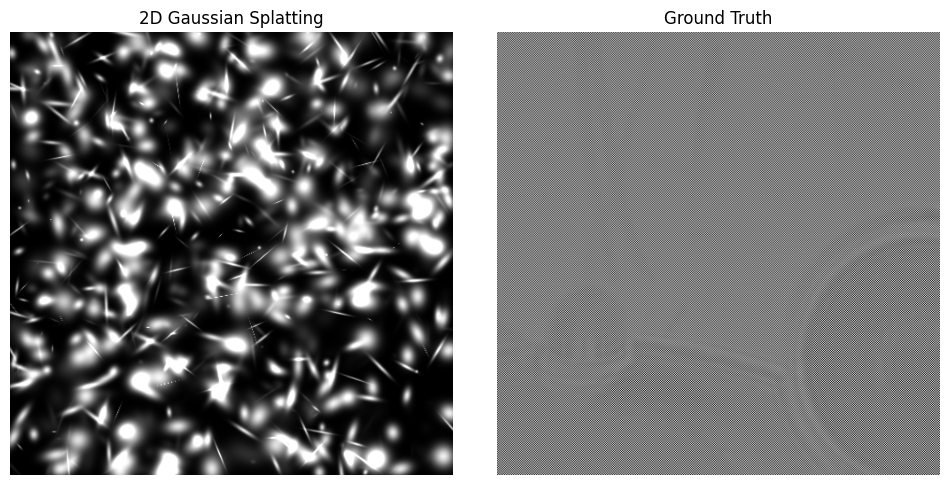

INFO:root:Epoch 1/2001, Loss: 0.4157, on 1000 points


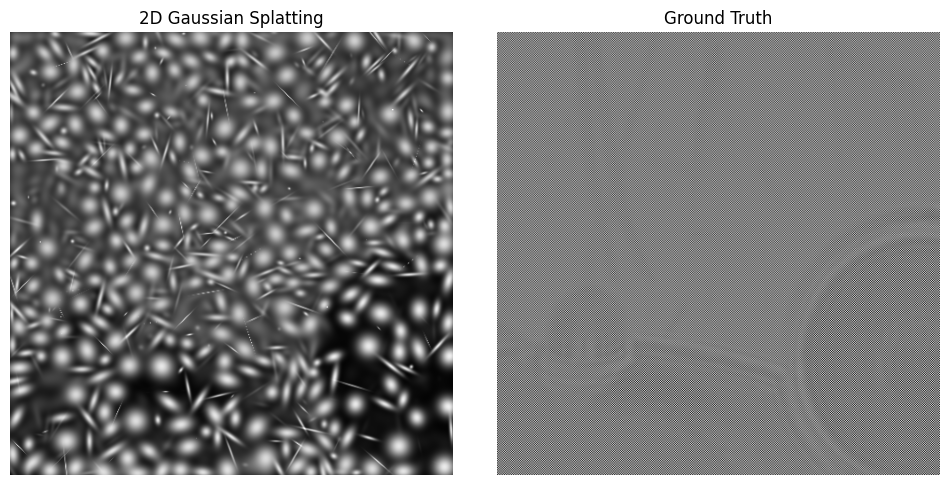

INFO:root:Epoch 101/2001, Loss: 0.3678, on 1000 points


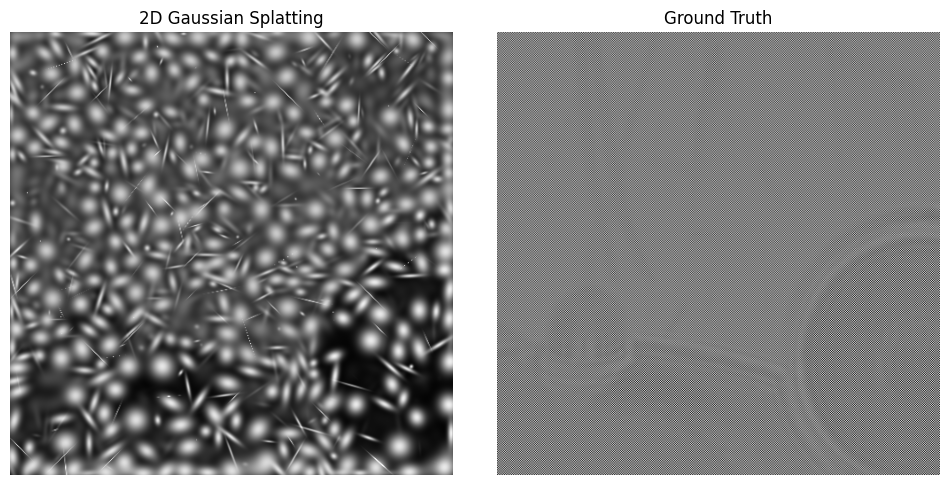

INFO:root:Epoch 201/2001, Loss: 0.3673, on 1000 points


Split 22 points
Cloned 14 points


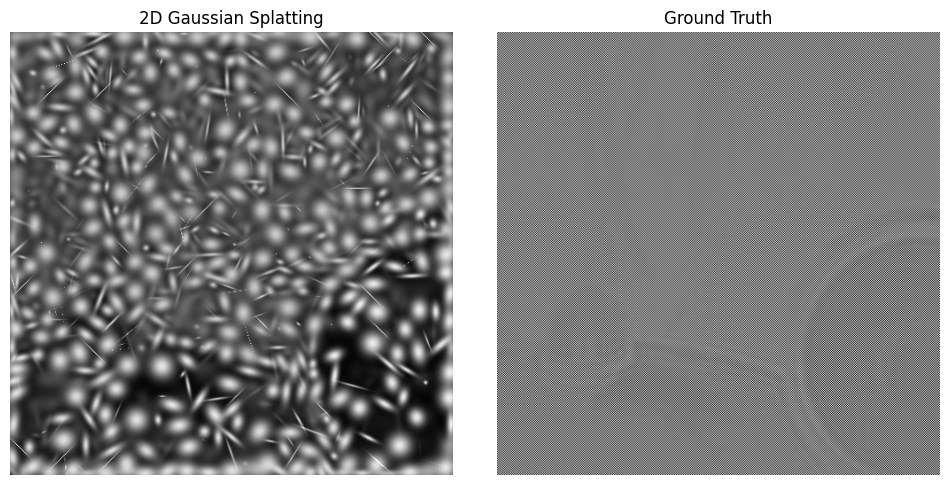

INFO:root:Epoch 301/2001, Loss: 0.3671, on 1000 points


Pruned 47 points


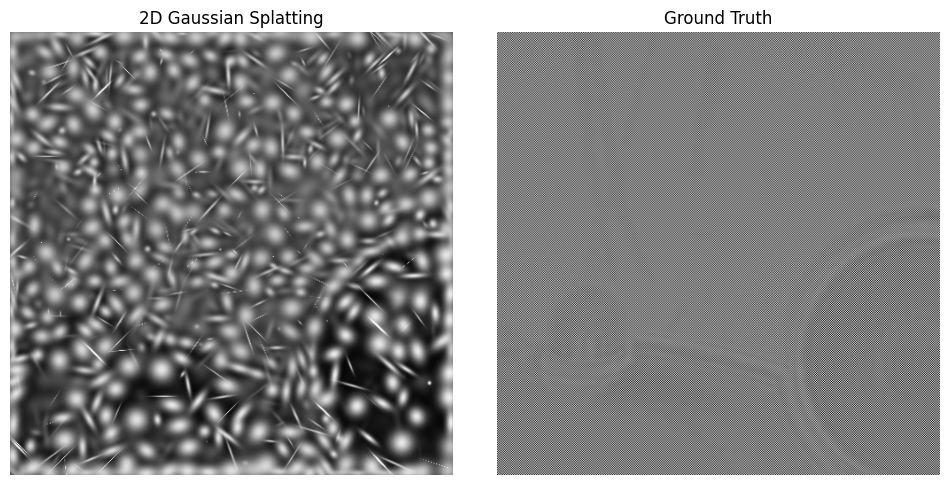

INFO:root:Epoch 401/2001, Loss: 0.3673, on 1029 points


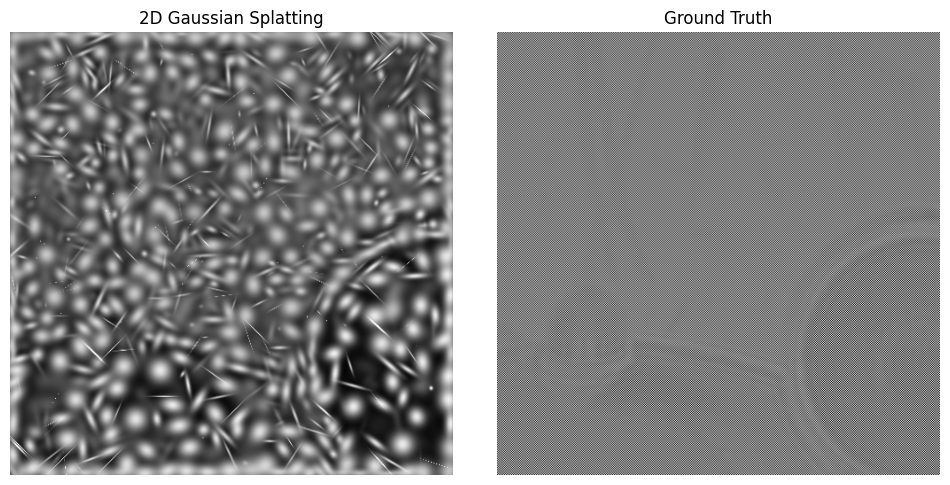

INFO:root:Epoch 501/2001, Loss: 0.3673, on 1029 points


Split 22 points
Cloned 10 points


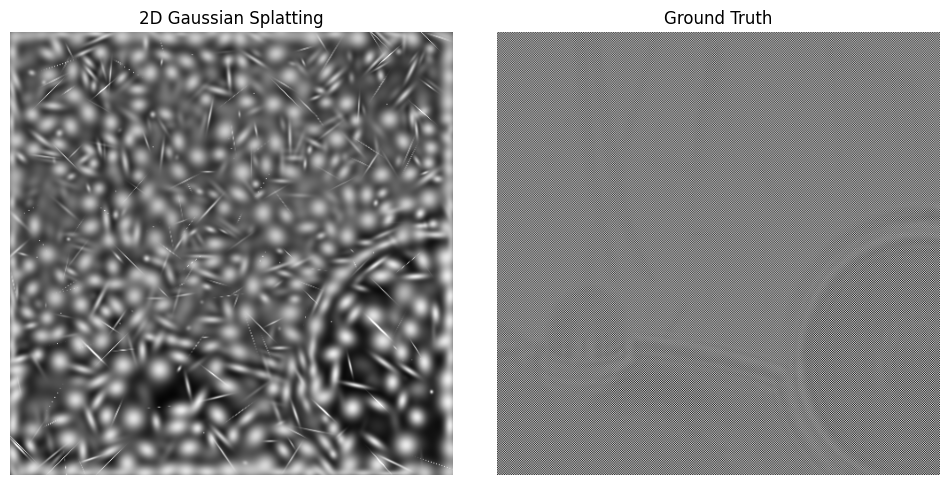

INFO:root:Epoch 601/2001, Loss: 0.3671, on 1029 points


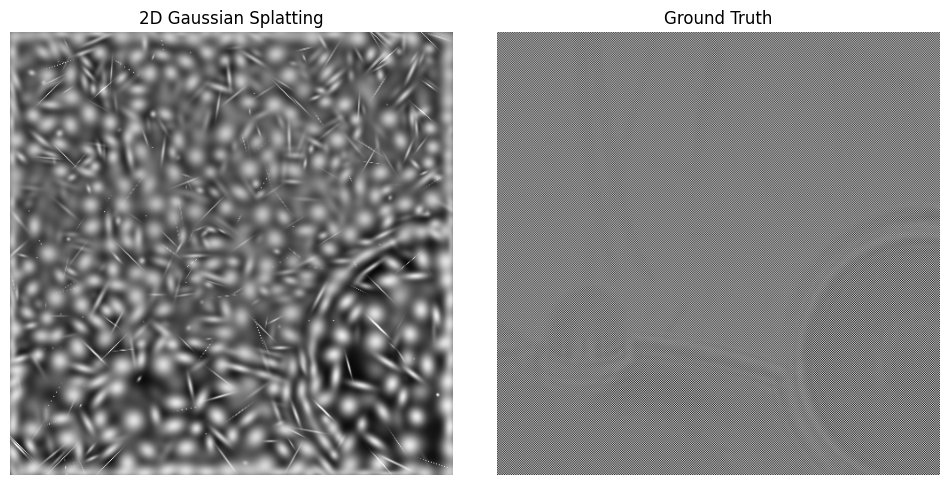

INFO:root:Epoch 701/2001, Loss: 0.3670, on 1061 points


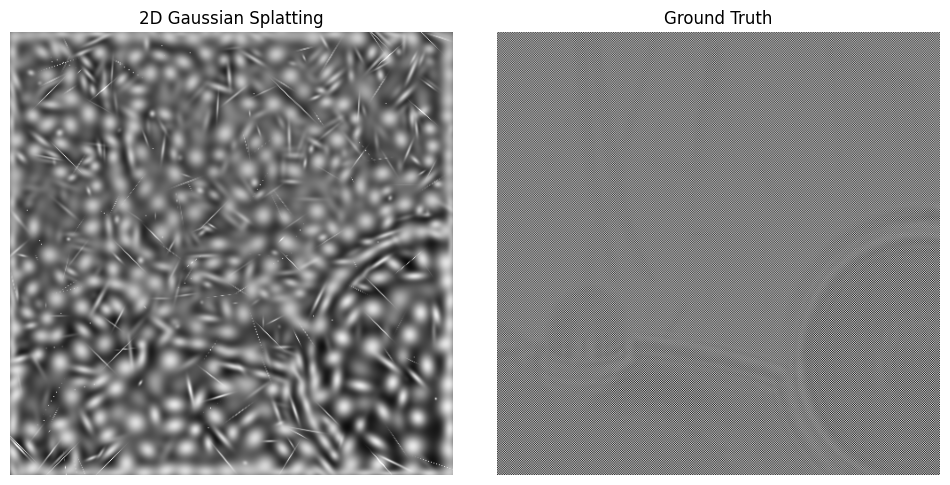

INFO:root:Epoch 801/2001, Loss: 0.3669, on 1061 points


Split 25 points
Cloned 3 points


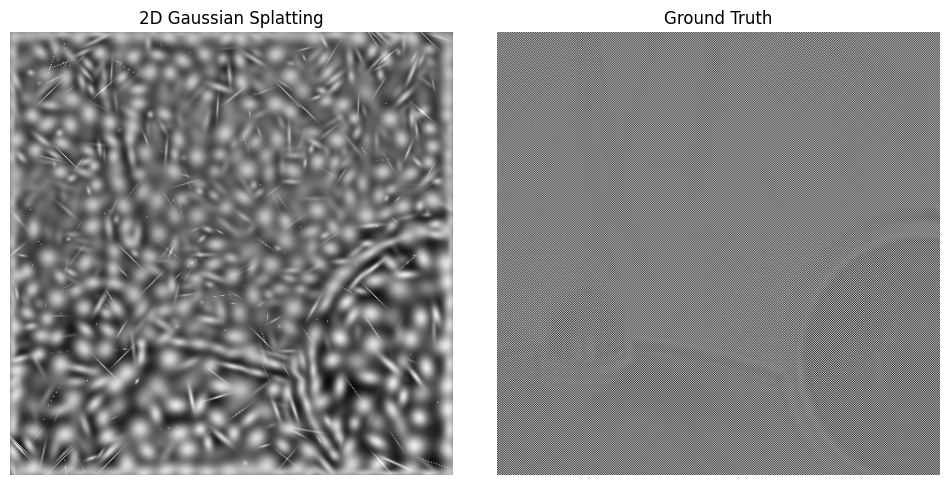

INFO:root:Epoch 901/2001, Loss: 0.3669, on 1061 points


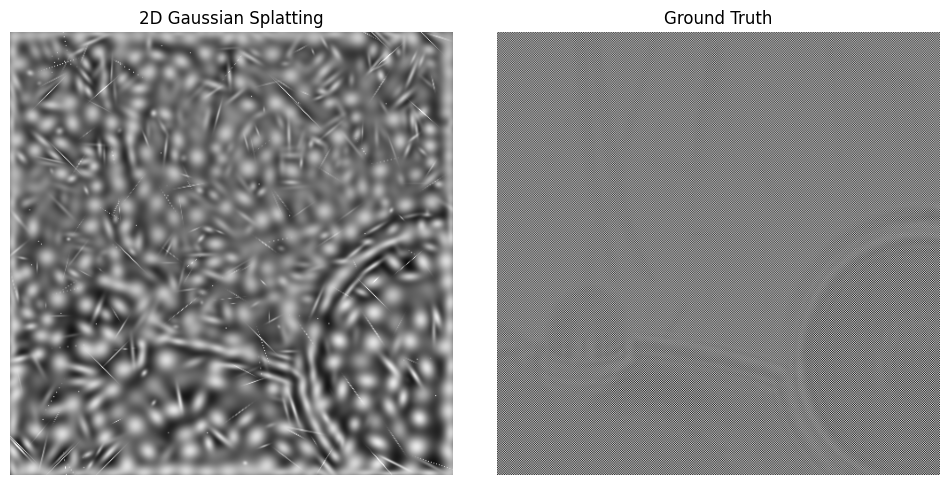

INFO:root:Epoch 1001/2001, Loss: 0.3669, on 1089 points


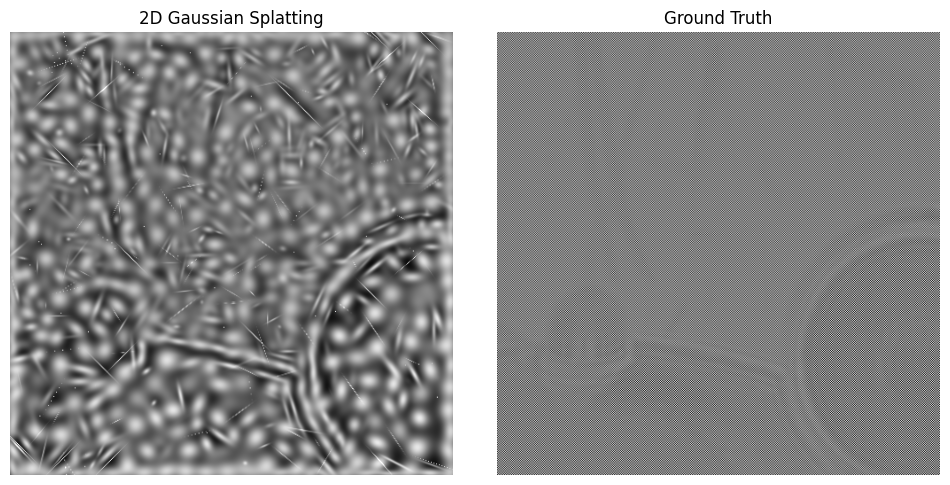

INFO:root:Epoch 1101/2001, Loss: 0.3669, on 1089 points


Split 25 points
Cloned 3 points


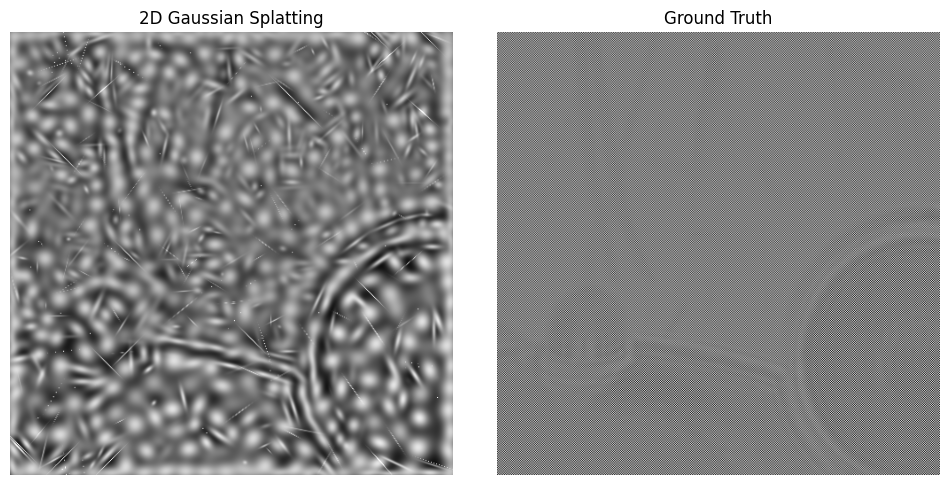

INFO:root:Epoch 1201/2001, Loss: 0.3668, on 1089 points


OutOfMemoryError: CUDA out of memory. Tried to allocate 3.12 GiB. GPU 0 has a total capacity of 14.74 GiB of which 2.92 GiB is free. Process 5613 has 11.81 GiB memory in use. Of the allocated memory 11.64 GiB is allocated by PyTorch, and 39.34 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [8]:
num_epochs = 2001
#Initialize weights
weights = nn.Parameter(W_values)
learning_rate = 0.01
optimizer = Adam([weights], lr=learning_rate)
densification_interval = 300
display_interval = 100
display_loss = False

# Define the training loop
for epoch in range(num_epochs):
    # Remove points with low alpha values and update the mask
    if epoch % (densification_interval + 1) == 0 and epoch > 0:
        # Find indices of points to remove
        indices_to_remove = (torch.sigmoid(weights[:, 3]) < 0.01).nonzero(as_tuple=True)[0]

        if len(indices_to_remove) > 0:
            print(f"Pruned {len(indices_to_remove)} points")

        # Update the mask
        mask[indices_to_remove] = False

        # Zero-out parameters and their gradients
        weights.data[~mask] = 0.0

    # Clean up memory
    gc.collect()
    torch.cuda.empty_cache()

    # Get the active points
    outputs = weights[mask]

    # Calculate the batch size
    batch_size = outputs.shape[0]

    # Extract the scale, rotation, alpha, color, and coordinate values
    scales = torch.sigmoid(outputs[:, 0:2])
    rotations = np.pi / 2 * torch.tanh(outputs[:, 2])
    alphas = torch.sigmoid(outputs[:, 3])
    colors = torch.sigmoid(outputs[:, 4:7])
    pixel_coords = torch.tanh(outputs[:, 7:9])

    # Calculate the colors with alpha
    colors_with_alpha = colors * alphas.view(batch_size, 1)

    # Generate the Gaussian splatting
    gaussian_tensor = generate_gaussians(KERNEL_SIZE, scales, rotations, pixel_coords, colors, image_size, device=device)

    # Calculate the loss
    loss = total_loss(gaussian_tensor, target_tensor, weight=0.2)

    # Backpropagate the loss
    optimizer.zero_grad()
    loss.backward()

    # Apply zeroing out of gradients
    if mask is not None:
        weights.grad.data[~mask] = 0.0

    # Densification
    if epoch % densification_interval == 0 and epoch > 0:
        # Calculate the gradient norms
        gradient_norms = torch.norm(weights.grad[mask][:, 7:9], dim=1, p=2)
        gaussian_norms = torch.norm(torch.sigmoid(weights.data[mask][:, 0:2]), dim=1, p=2)

        # Sort the gradient norms
        sorted_grads, sorted_grads_indices = torch.sort(gradient_norms, descending=True)
        sorted_gauss, sorted_gauss_indices = torch.sort(gaussian_norms, descending=True)

        # Find the indices of points with large gradient norms and large Gaussian values
        grad_threshold = 0.002
        large_gradient_mask = (sorted_grads > grad_threshold)
        large_gradient_indices = sorted_grads_indices[large_gradient_mask]


        gauss_threshold = 0.75
        large_gauss_mask = (sorted_gauss > gauss_threshold)
        large_gauss_indices = sorted_gauss_indices[large_gauss_mask]

        common_indices_mask = torch.isin(large_gradient_indices, large_gauss_indices)
        common_indices = large_gradient_indices[common_indices_mask]
        distinct_indices = large_gradient_indices[~common_indices_mask]

        # Split points with large coordinate gradient and large Gaussian values
        if len(common_indices) > 0:
            print(f"Split {len(common_indices)} points")
            start_index = num_primary_samples + 1
            end_index = num_primary_samples + 1 + len(common_indices)
            mask[start_index:end_index] = True
            weights.data[start_index:end_index, :] = weights.data[common_indices, :]
            scale_reduction_factor = 1.6
            weights.data[start_index:end_index, 0:2] /= scale_reduction_factor
            weights.data[common_indices, 0:2] /= scale_reduction_factor
            num_primary_samples += len(common_indices)

        # Clone points with large coordinate gradient and small Gaussian values
        if len(distinct_indices) > 0:
            print(f"Cloned {len(distinct_indices)} points")
            start_index = num_primary_samples + 1
            end_index = num_primary_samples + 1 + len(distinct_indices)
            mask[start_index:end_index] = True
            weights.data[start_index:end_index, :] = weights.data[distinct_indices, :]

            # Calculate the movement direction based on the positional gradient
            positional_gradients = weights.grad[distinct_indices, 7:9]
            gradient_magnitudes = torch.norm(positional_gradients, dim=1, keepdim=True)
            normalized_gradients = positional_gradients / (gradient_magnitudes + 1e-8)

            # Define a step size for the movement
            step_size = 0.01

            # Move the cloned Gaussians
            weights.data[start_index:end_index, 7:9] += step_size * normalized_gradients

            num_primary_samples += len(distinct_indices)

    # Update the weights
    optimizer.step()

    # Initialize the loss history
    loss_history = []
    num_points_history = []

    # Create a logger
    logger_tensorboard = tensorboard.SummaryWriter()
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)

    # Display the results
    if epoch % display_interval == 0:
        # Log the loss
        logger_tensorboard.add_scalar('Loss', loss.item(), epoch)
        logger_tensorboard.add_scalar('Number of Points', len(outputs), epoch)

        # Store the loss and number of points in history
        loss_history.append(loss.item())
        num_points_history.append(len(outputs))

        # Create a figure with subplots
        fig, ax = plt.subplots(1, 2, figsize=(12, 6))

        # Display the generated image
        ax[0].imshow(gaussian_tensor.cpu().detach().numpy())
        ax[0].set_title('2D Gaussian Splatting')
        ax[0].axis('off')

        # Display the ground truth
        ax[1].imshow(target_tensor.cpu().detach().numpy())
        ax[1].set_title('Ground Truth')
        ax[1].axis('off')

        # Display the image
        plt.subplots_adjust(wspace=0.1)
        plt.pause(0.1)

        # Save the image
        img = Image.fromarray((gaussian_tensor.cpu().detach().numpy() * 255).astype(np.uint8))

        # Clear the figure
        plt.clf()
        plt.close()

        # Log the loss
        logger.info(f"Epoch {epoch+1}/{num_epochs}, Loss: {loss.item():.4f}, on {len(outputs)} points")